## Starfysh tutorial

#### Azizi Lab

Siyu He, Yinuo Jin

08-05-2022

In [3]:
import sys
IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    !pip3 install scanpy
    #!pip3 install histomicstk
    from google.colab import drive
    drive.mount('/content/drive')
    import sys
    sys.path.append('/content/drive/MyDrive/SpatialModelProject/model_test_colab/')

In [4]:
import pandas as pd
import scanpy as sc
import numpy as np
import torch
import os
import matplotlib.pyplot as plt
import torch.optim as optim
from torch.utils.data import DataLoader
from matplotlib.pyplot import rc_context

In [5]:
import matplotlib.font_manager
from matplotlib import rcParams

font_list = []
fpaths = matplotlib.font_manager.findSystemFonts()
for i in fpaths:
    try:
        f = matplotlib.font_manager.get_font(i)
        font_list.append(f.family_name)
    except RuntimeError:
        pass

font_list = set(font_list)
plot_font = 'Helvetica' if 'Helvetica' in font_list else 'FreeSans'

rcParams['font.family'] = plot_font
rcParams.update({'font.size': 10})

# Mute warning, TODO: manually fix the adata warnings (mostly due to "modification on copy" or version 
import warnings
warnings.filterwarnings('ignore')

In [6]:
import importlib
#importlib.reload(utils)

### load starfysh

In [224]:
sys.path.append('../')
from starfysh import (utils,
                      plot_utils,
                      starfysh,
                      dataloader,
                      post_analysis,
                      AA
                      )

#### (1). load data and gene signature

In [10]:
# set the data folder
if IN_COLAB:
    data_folder = '/content/drive/MyDrive/SpatialModelProject/data'
else:
    data_folder = '../data/'
    #data_folder = 'simu_data'


In [11]:
sample_id='CID44971' # , CID44971, CID4465, CID4290, CID4535, 1142243F, 1160920F
sig_file_name = 'bc_signatures_version_0201.csv'

adata_sample, adata_sample_normed = utils.load_adata(data_folder,sample_id,n_genes=2000)
gene_sig = pd.read_csv(os.path.join(data_folder,sig_file_name))

## filter the low expressed genes
gene_sig = utils.filter_gene_sig(gene_sig,adata_sample.to_df())

[2022-08-04 21:24:42] Preprocessing1: delete the mt and rp
[2022-08-04 21:24:42] Preprocessing2: Normalize
[2022-08-04 21:24:42] Preprocessing3: Logarithm
[2022-08-04 21:24:42] Preprocessing4: Find the variable genes


In [12]:
if data_folder =='simu_data':
    member = pd.read_csv(os.path.join(data_folder,sample_id,'members.st_synth.csv'),index_col=0)
    proportions = pd.read_csv(os.path.join(data_folder,sample_id,'proportions.st_synth.csv'),index_col=0)
    gene_sig = gene_sig.iloc[:,[1,3,4,7,8]]
    gene_sig.columns=['CAFs','Normal Epithelial','Myeloid','T-cells','Cancer Epithelial']
    gene_sig = gene_sig.reindex(columns=['CAFs','Cancer Epithelial','Myeloid','Normal Epithelial','T-cells'])

#### (2). Preprocessing & finding anchor spots.

In [13]:
if data_folder =='simu_data':
    umap_df = utils.get_umap(adata_sample)
    map_info = utils.get_simu_map_info(umap_df)
else:
    #adata_image, adata_image_h, adata_image_e,map_info = utils.preprocess_img(data_folder,sample_id,adata_sample.obs.index,hchannal=False)
    adata_image, map_info = utils.preprocess_img(data_folder,sample_id,adata_sample.obs.index,hchannal=False)


Preparing arguments for model training:
- Raw & normalized counts after taking highly variable genes
- filtered signature genes
- library size & spatial smoothed library size (log-transformed)
- Anchor spot indices (`anchors_df`) for each cell type & their signature means (`sig_means`)


In [14]:
# Preparing arguments for model training
visium_args = utils.VisiumArguments(adata_sample,
                                    adata_sample_normed,
                                    gene_sig,
                                    map_info,
                                    n_anchors=60,
                                    window_size=5
                                   )


[2022-08-04 21:25:00] Filtering signatures not highly variable...
[2022-08-04 21:25:00] Smoothing library size by taking averaging with neighbor spots...


	 The number of original variable genes in the dataset (2000,)
	 The number of siganture genes in the dataset (691,)
	 After filter out some genes in the signature not in the var_names ... (653,)
	 After filter out some genes not highly expressed in the signature ... (647,)
	 Combine the varibale and siganture, the total unique gene number is ... 2474
	 The number of original variable genes in the dataset (2000,)
	 The number of siganture genes in the dataset (691,)
	 After filter out some genes in the signature not in the var_names ... (653,)
	 After filter out some genes not highly expressed in the signature ... (647,)
	 Combine the varibale and siganture, the total unique gene number is ... 2474


[2022-08-04 21:25:01] Retrieving & normalizing signature gene expressions...
[2022-08-04 21:25:01] Identifying anchor spots (highly expression of specific cell-type signatures)...


In [16]:
?utils.VisiumArguments

Init signature: utils.VisiumArguments(adata, adata_norm, gene_sig, map_info, **kwargs)
Docstring:      Loading Visium AnnData, perform preprocessing, library-size smoothing & Anchor spot detection
File:           ~/Desktop/azizi_lab/visium/sc_transcriptome_ana/starfysh/utils.py
Type:           type
Subclasses:     


In [15]:
adata_sample, adata_sample_normed = visium_args.get_adata() # adata after preprocessing & taking highly-variable genes
anchors_df = visium_args.get_anchors() # anchor spot indices
anchors_df.head()

,T_cells_c0_CD4+_CCR7,T_cells_c1_CD4+_IL7R,T_cells_c3_CD4+_Tfh_CXCL13,T_cells_c2_CD4+_T-regs_FOXP3,B_cells_Memory,B_cells_Naive,NK,Macrophage_M1,Macrophage_M2,Endothelial,...,cDC,pDC,Terminal_exhaustion,Precursor_exhaustion,CAFs_MSC_iCAF-like,CAFs_myCAF-like,PVL_Differentiated,PVL_Immature,Normal_epithelial,Plasmablasts
0,177,898,898,898,1122,1122,898,1139,1139,828,...,1138,1122,898,710,861,1115,35,1115,37,866
1,176,731,1121,731,1139,1139,1039,1122,1122,707,...,1122,707,1059,259,993,861,37,35,48,783
2,235,1038,896,1039,916,1121,895,1097,1097,552,...,938,292,895,412,1115,993,48,552,655,956
3,412,1039,1039,895,885,1138,897,1152,1152,292,...,1097,1089,1122,607,1138,1096,135,530,97,865
4,502,1121,731,897,1121,1152,1038,1138,1138,749,...,1140,1038,897,246,1038,1036,12,828,412,384


In [16]:
# Signature mean expression at each spot
sig_means = visium_args.sig_mean
sig_means.head()

,T_cells_c0_CD4+_CCR7,T_cells_c1_CD4+_IL7R,T_cells_c3_CD4+_Tfh_CXCL13,T_cells_c2_CD4+_T-regs_FOXP3,B_cells_Memory,B_cells_Naive,NK,Macrophage_M1,Macrophage_M2,Endothelial,...,cDC,pDC,Terminal_exhaustion,Precursor_exhaustion,CAFs_MSC_iCAF-like,CAFs_myCAF-like,PVL_Differentiated,PVL_Immature,Normal_epithelial,Plasmablasts
AACATTGGTCAGCCGT-1,0.067245,0.081645,0.134931,0.121587,0.083185,0.082299,0.103814,0.080889,0.072861,0.059915,...,0.000000,0.000000,0.080341,0.089898,0.103521,0.062867,0.049214,0.031842,0.060732,0.016802
CATCGAATGGATCTCT-1,0.252169,0.040822,0.202397,0.121587,0.110913,0.137164,0.207628,0.161778,0.172217,0.279604,...,0.334994,0.547135,0.321363,0.359592,0.155282,0.089809,0.623379,0.461706,0.303662,0.033604
CGGGTTGTAGCTTTGG-1,1.866049,1.387960,1.146916,1.519838,0.582294,0.891569,1.141953,0.815629,0.642500,1.358076,...,0.669987,0.547135,1.767498,1.977759,1.000707,0.341276,2.509921,1.608011,2.131155,0.060486
CCTAAGTGTCTAACCG-1,0.100868,0.081645,0.000000,0.000000,0.013864,0.027433,0.103814,0.033704,0.033119,0.139802,...,0.000000,0.000000,0.080341,0.000000,0.155282,0.062867,0.114833,0.063684,0.176676,0.000000
TCTGTGACTGACCGTT-1,0.773318,0.734802,0.472260,0.303968,0.277283,0.356628,0.726697,0.431407,0.430541,0.778897,...,0.000000,1.641405,0.241022,1.168676,0.759157,0.269428,1.509233,1.130384,1.579043,0.013441


#### (3). Spatial visualization of library size & gene expression

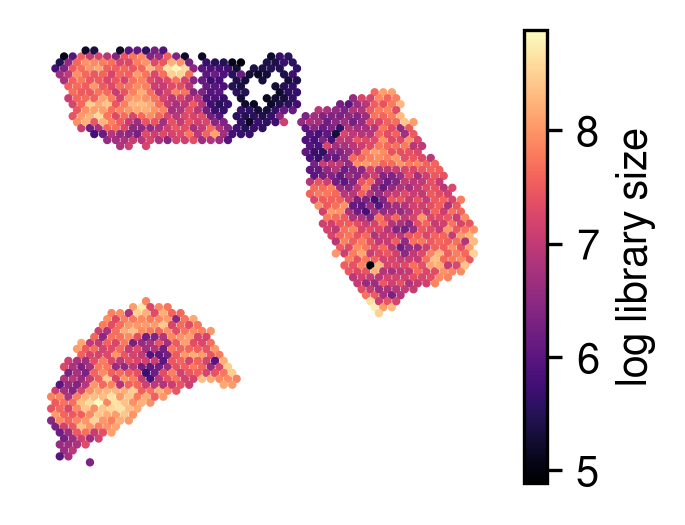

In [17]:
plot_utils.plot_spatial_var(map_info,
                            adata_sample,
                            visium_args.log_lib,
                            label='log library size'
                           )

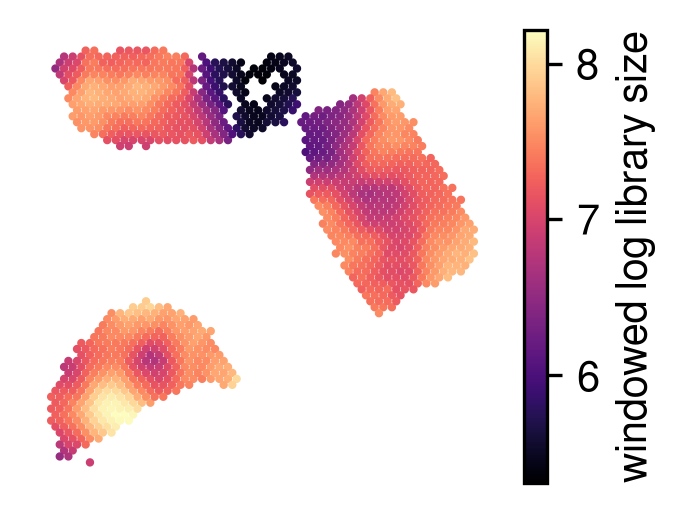

In [18]:
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 visium_args.win_loglib,
                 label='windowed log library size'
                )

plot raw gene expression:

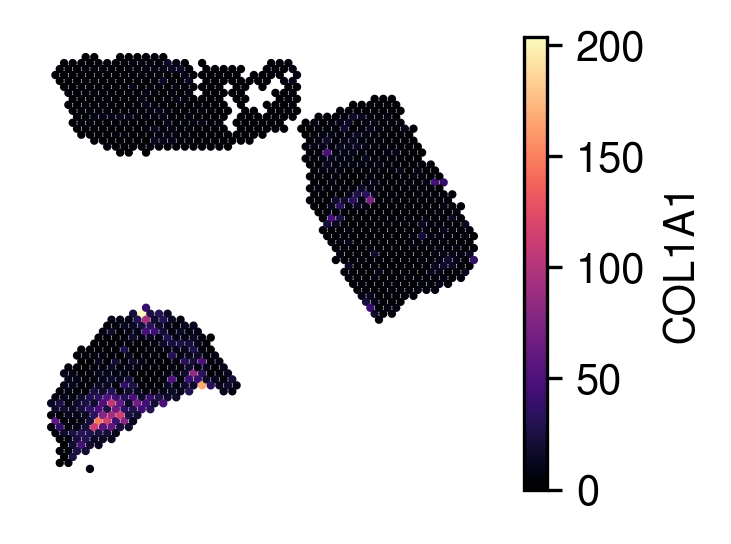

In [19]:
plot_gene_name = 'COL1A1'
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 adata_sample.to_df().loc[:,plot_gene_name],
                 label=plot_gene_name
                )

Plot anchor spots:

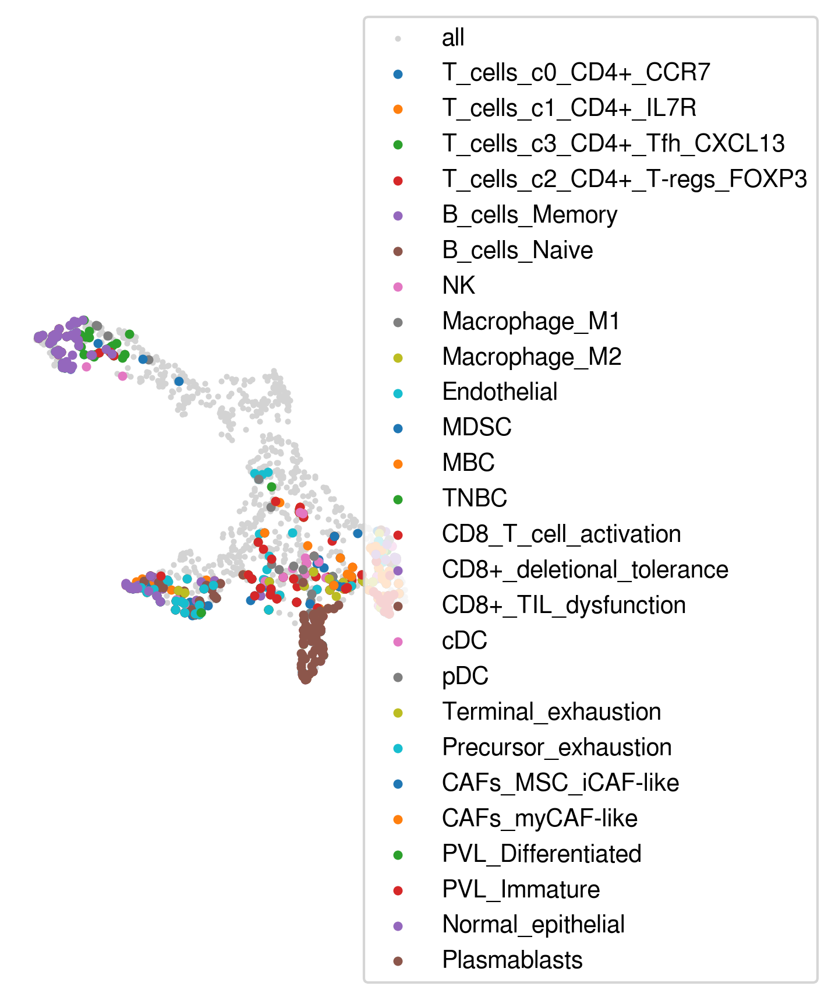

In [21]:
umap_df = utils.get_umap(adata_sample)
plot_utils.plot_anchor_spots(umap_df,
                             visium_args.pure_spots,
                             visium_args.sig_mean,
                             bbox_x=2
                            )

#### (4). Optional: appending anchor spots with archetypal analysis

Tasks:
- Finding archetypal spots & assign 1-1 mapping to their closest anchor spot neighbors
- Finding archetypal marker genes & append them to marker genes of annotated cell types
- Find novel cell type / cell states as the most distant archetypes (Not close to any anchor spots of annotated cell types)

In [140]:
importlib.reload(AA)
from starfysh.AA import ArchetypalAnalysis

[Note]<br>
Set `pc_ratio` $(0, 1)$ higher to find more # raw archetypes ($k$). If you encounter `NaN` errors when estimating $k$, please decrease `pc_ratio`.

First, we find major archetypal spots & marker genes:

In [141]:
aa_model = ArchetypalAnalysis(adata_orig=adata_sample_normed)
archetype, arche_dict, major_idx = aa_model.compute_archetypes(pc_ratio=.02, display=False)


[2022-08-04 23:23:25] Computing intrnsic dimension to estimate k...
[2022-08-04 23:23:26] Computing 26 archetypes...


104 components are retained using conditional_number=49.00


[2022-08-04 23:24:22] Calculating UMAPs for counts + Archetypes...
[2022-08-04 23:24:29] 0.6721 variance explained by raw archetypes.
Merging those within 20 NNs to get major archetypes


[2022-08-04 23:24:29] Finding 40 nearest neighbors for each archetype...
[2022-08-04 23:24:29] Finding 30 top marker genes for each archetype...
... storing 'sample' as categorical


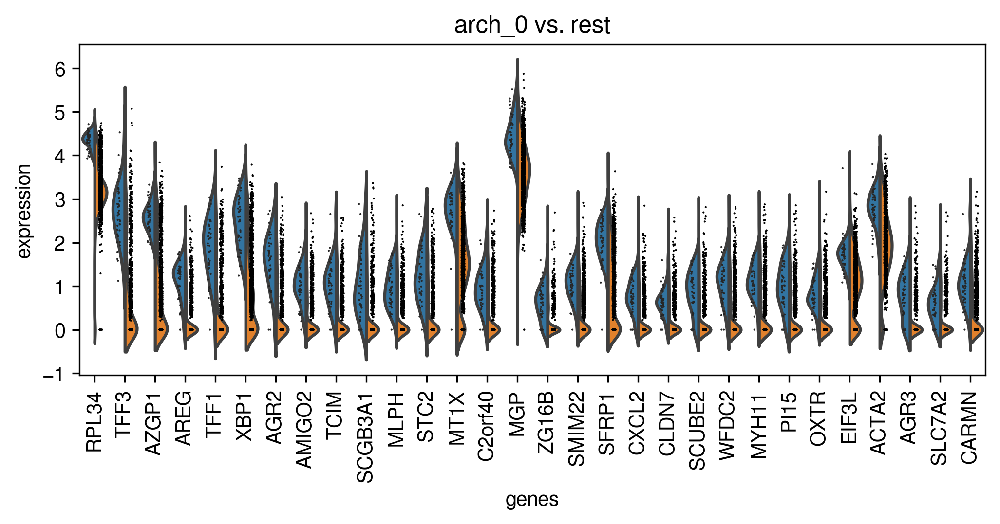

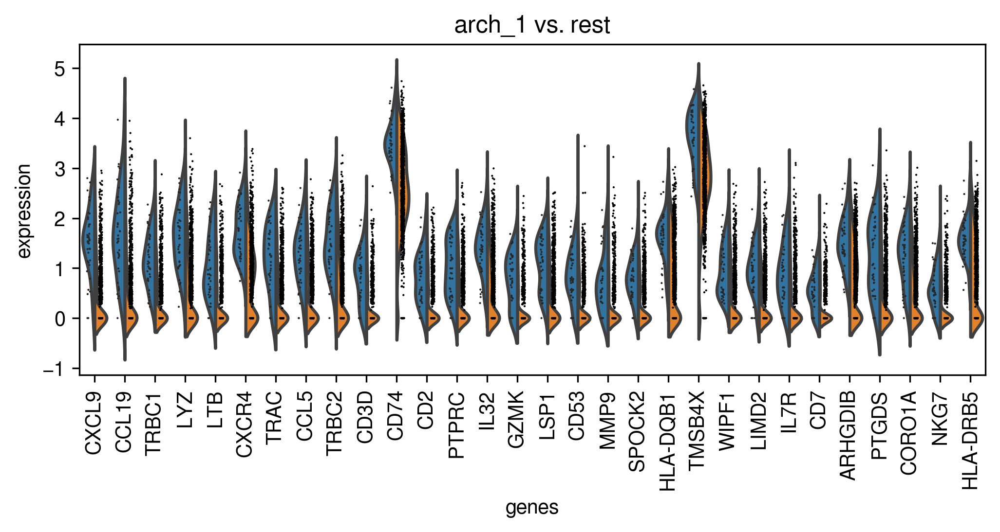

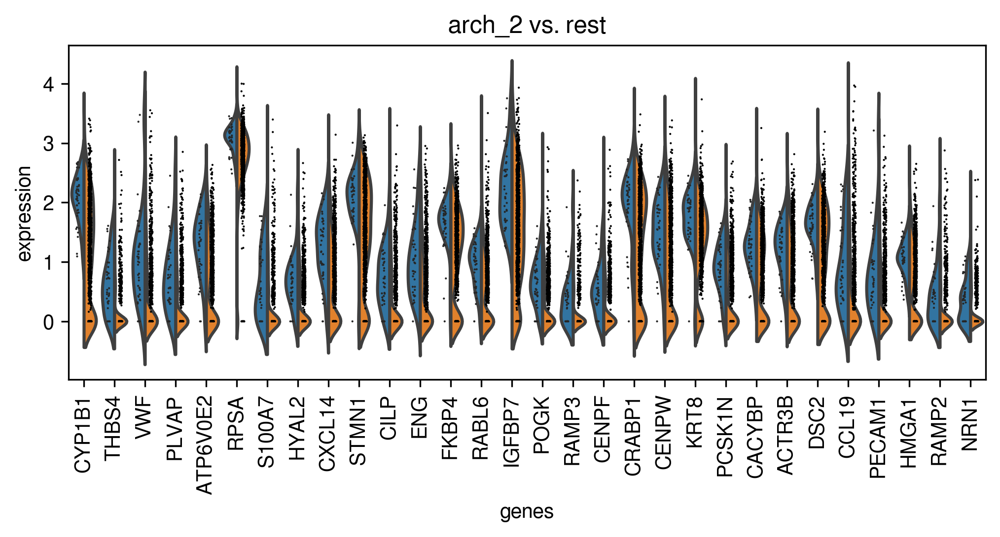

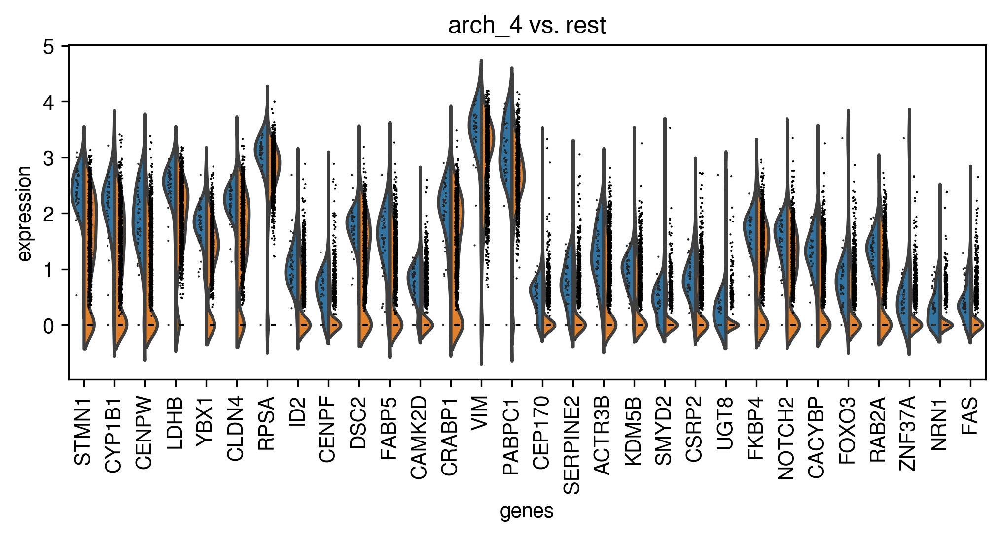

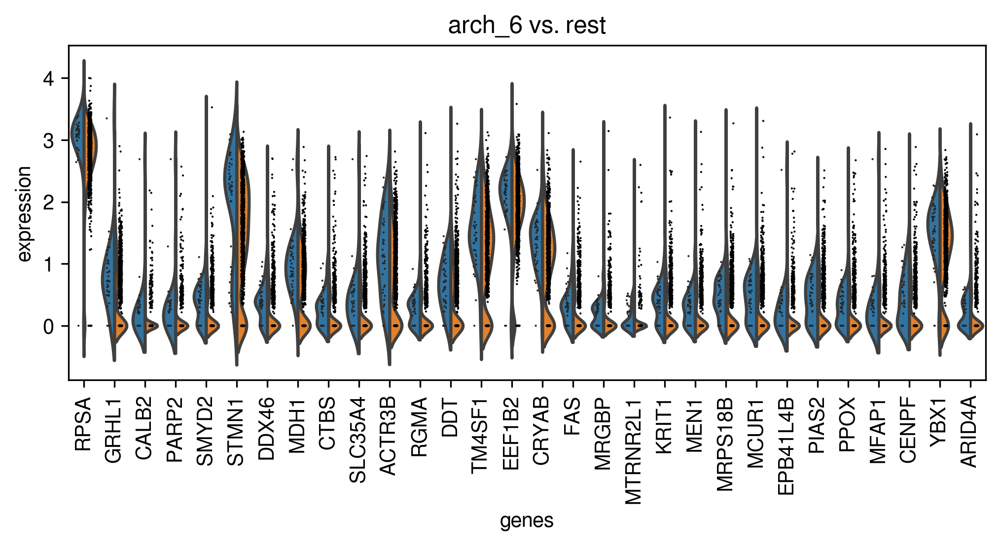

...

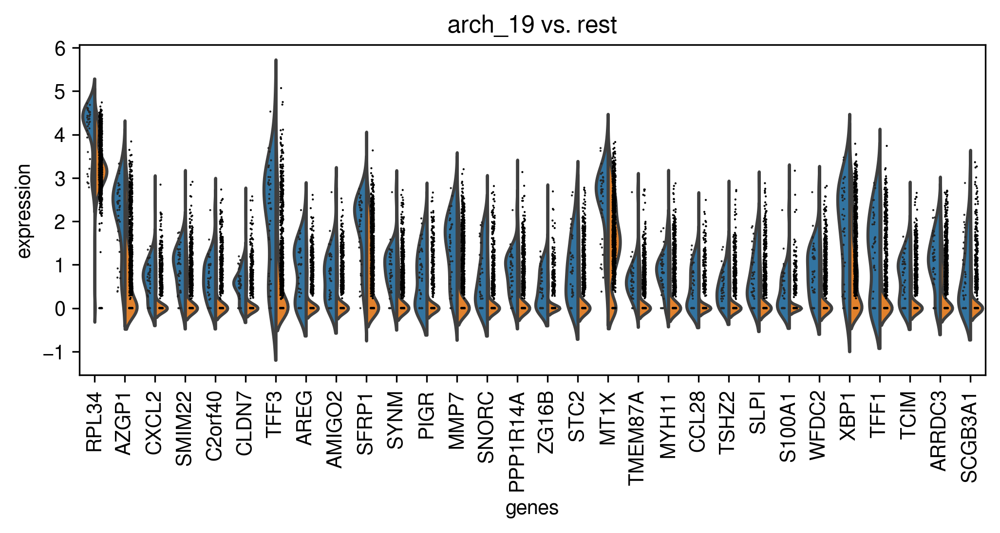

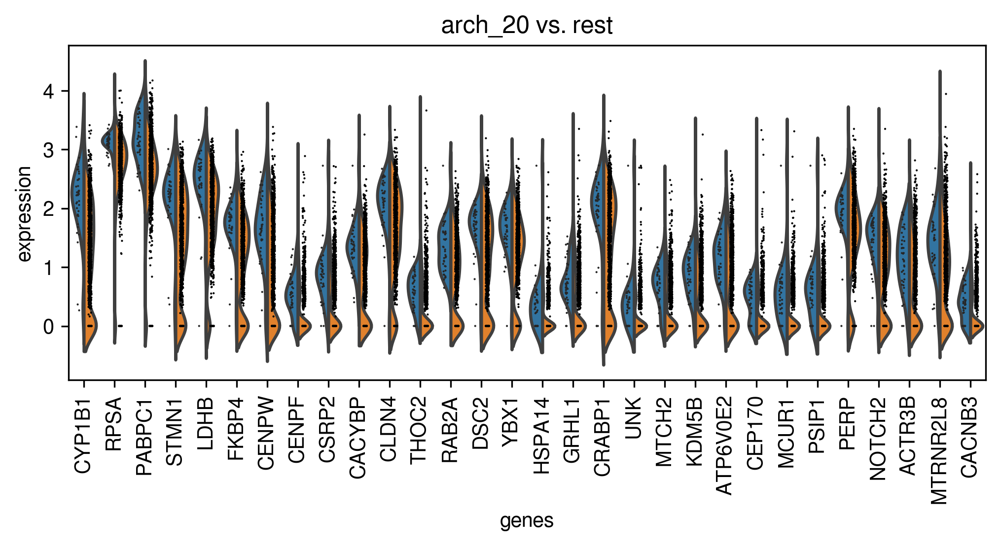

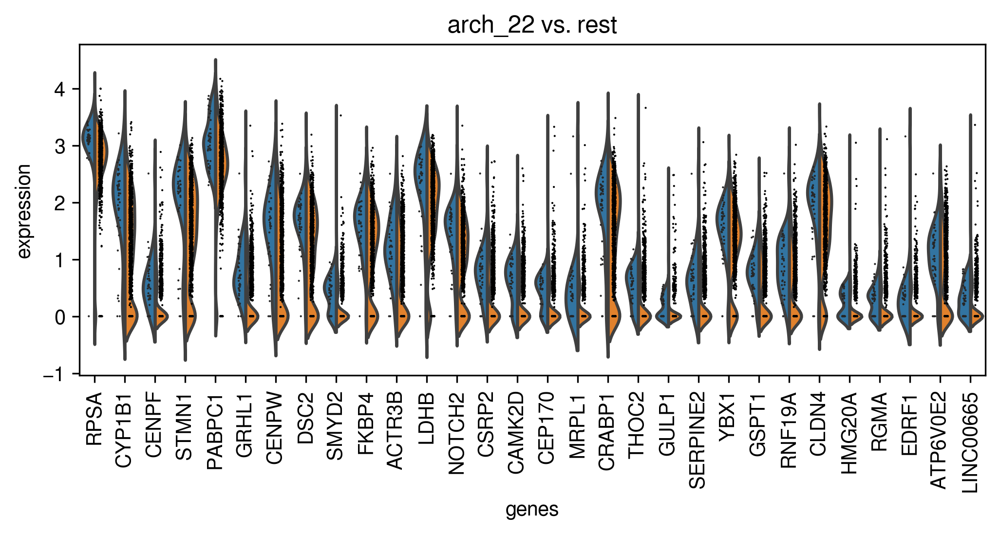

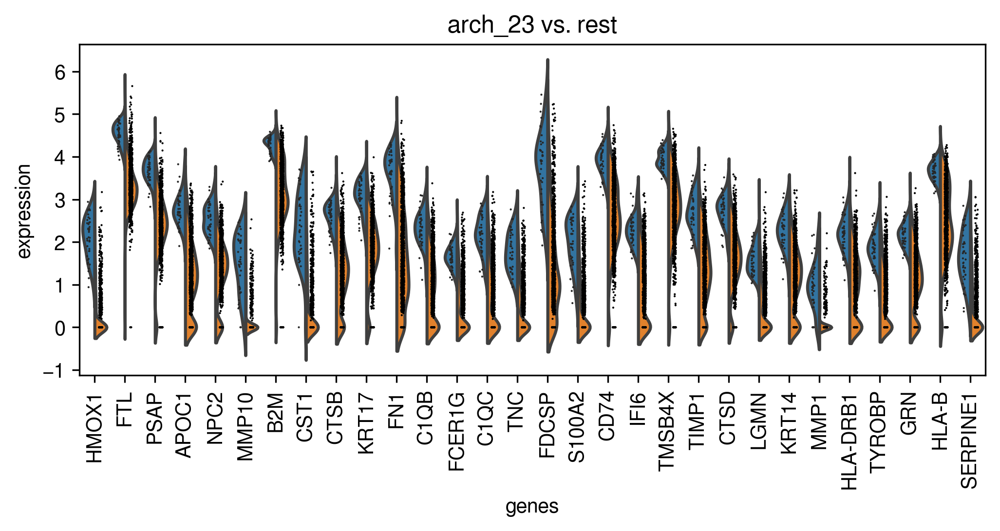

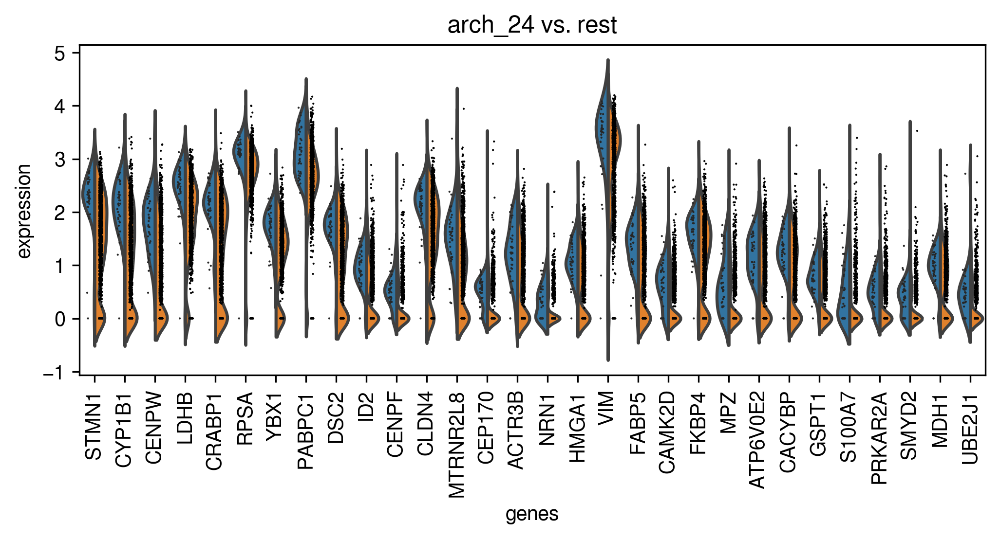

In [142]:
# Find archetypal spots, major specifies whether find hierarchical archetypes
arche_df = aa_model.find_archetypal_spots(major=True)

# Find marker genes
markers_df = aa_model.find_markers(n_markers=30, display=True)

# Map archetypes to closest anchors (1-1 per cell type) 
map_df, map_dict = aa_model.assign_archetypes(anchors_df)

# Find the most distant archetypes that are not assigned to any annotated cell types
distant_arches = aa_model.find_distant_archetypes(anchors_df, n=5)

##### Visualize archetypes

- Hierarchical structure of archetypes (raw archetypes within certain mutual distance of `r` will shrink into major archetypes): 

In [146]:
aa_model.arche_dict

{0: array([ 0,  3, 21, 25]),
 1: array([ 1,  7,  8, 10]),
 2: array([ 2, 14, 15, 16]),
 4: array([ 4,  5,  9, 17, 18])}

The dictionary above states that, archetypes `0, 1, 2 & 4` have their hierarchical structure, harboring more than one raw archetypes.

- Visualize archetypes in 3D UMAP:

(<Figure size 1800x1200 with 1 Axes>, <Axes3DSubplot:>)

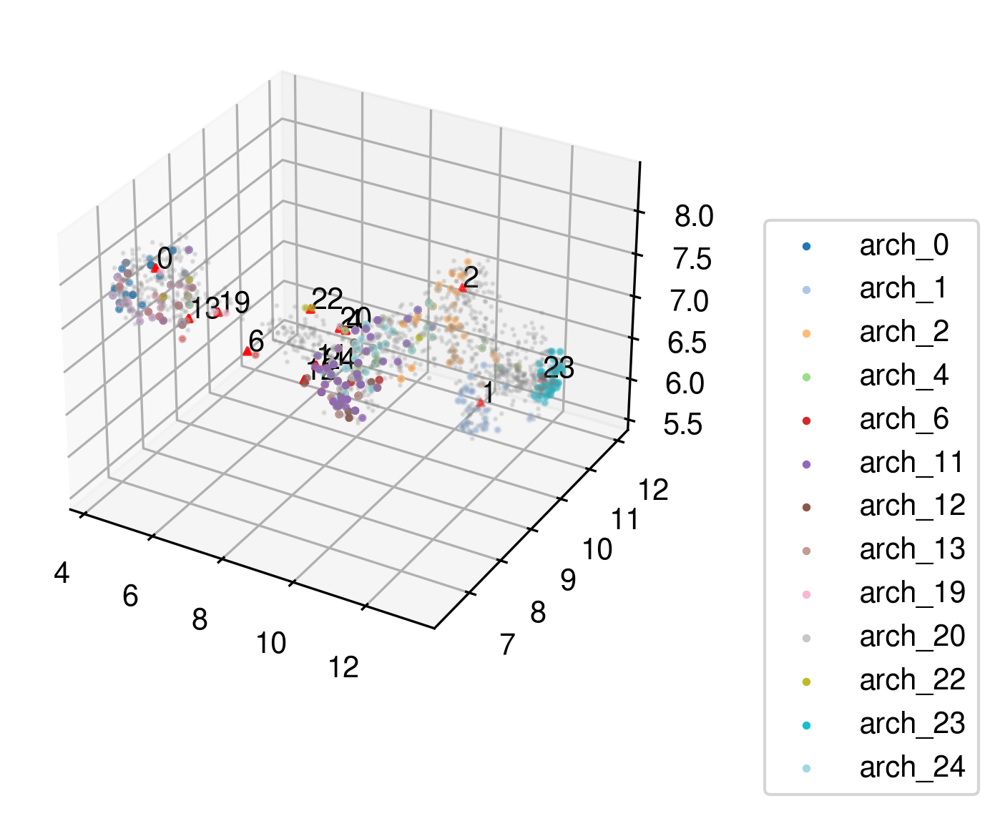

In [147]:
aa_model.plot_archetypes(do_3d=True)

- Juxtapose of anchor spots & archetypal spots:

(<Figure size 2700x900 with 2 Axes>, (<AxesSubplot:>, <AxesSubplot:>))

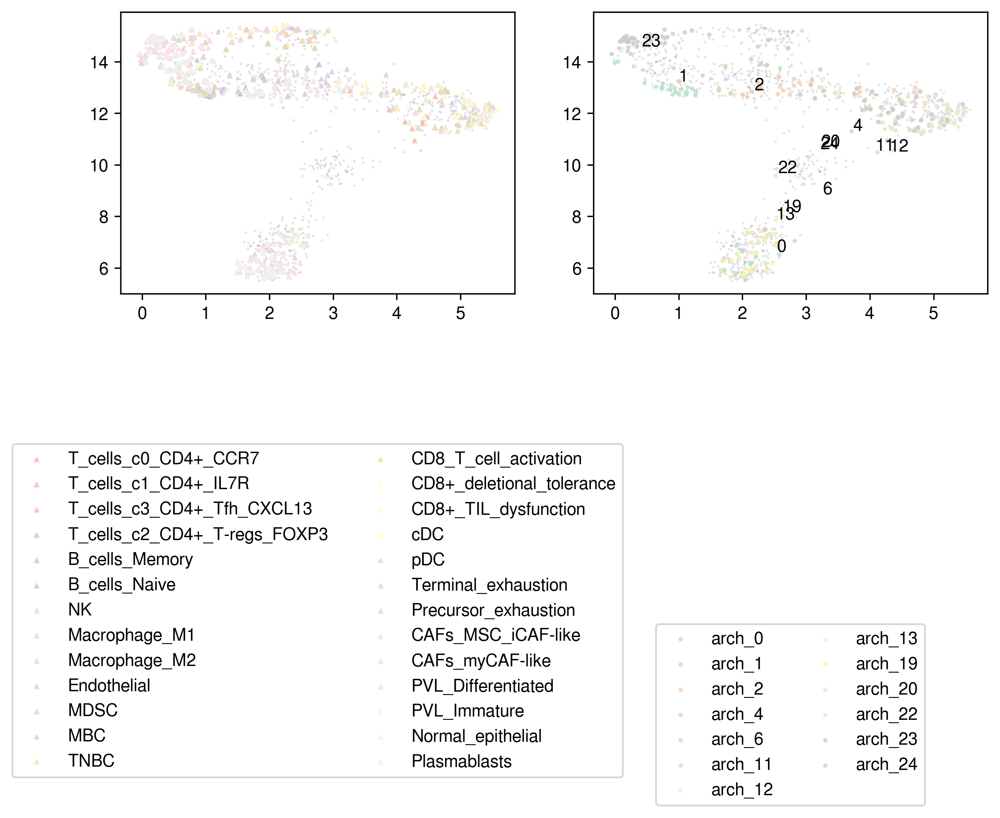

In [149]:
aa_model.plot_anchor_archetype_clusters(anchors_df)

- Visualize overlapping ratio between archetypal & anchor spots:

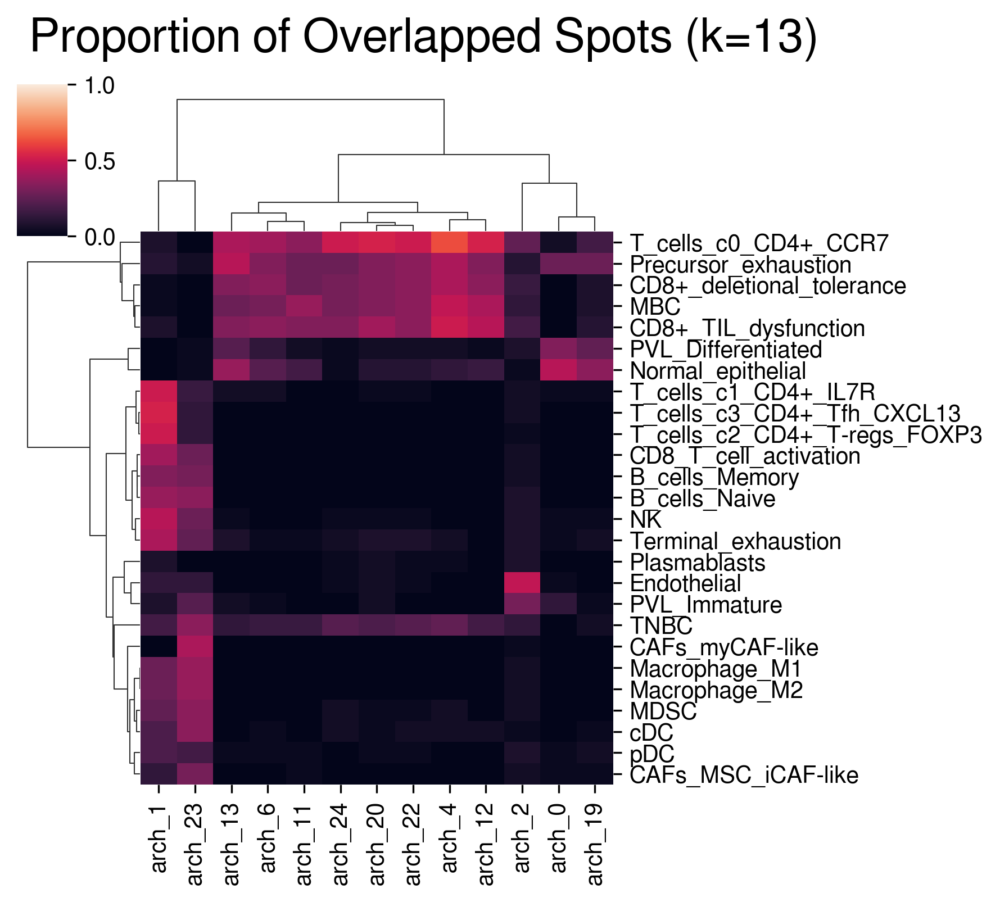

In [150]:
aa_model.plot_mapping(map_df)

- Visualize overlapping features between subset of anchors & archetypes: <br>
  E.g. `T-reg (FOXP3)` & `arch_1`


(<Figure size 2700x900 with 2 Axes>, (<AxesSubplot:>, <AxesSubplot:>))

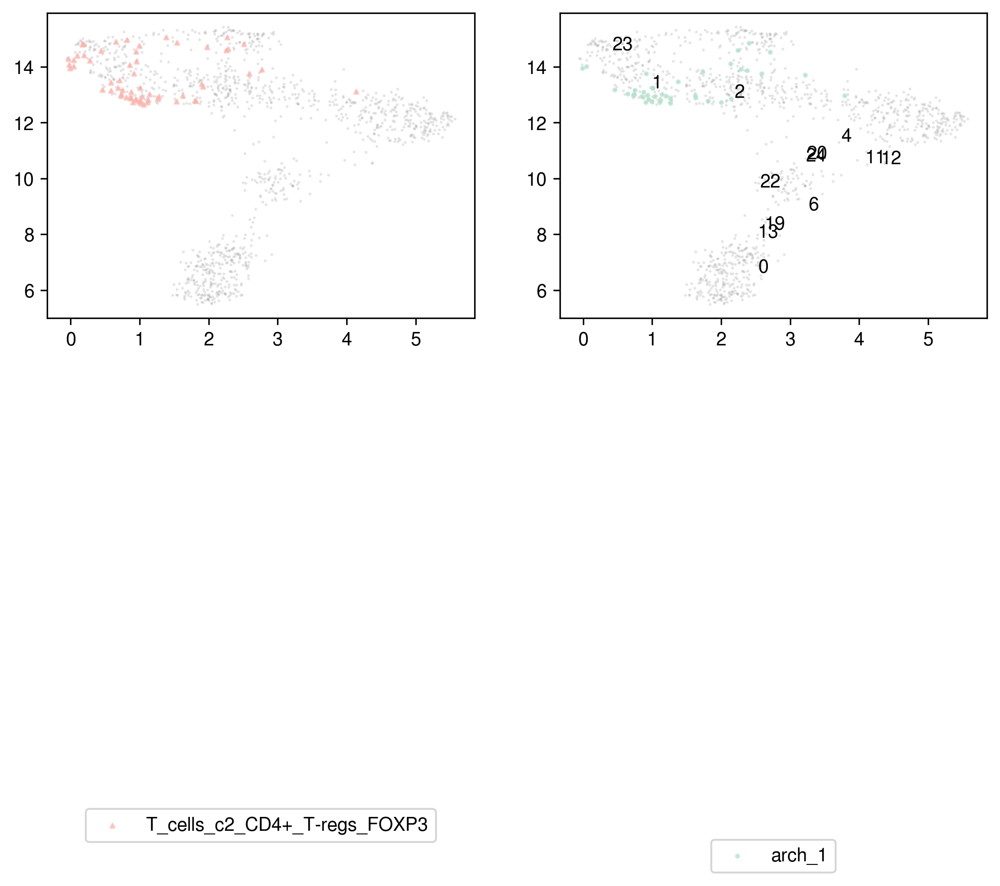

In [151]:
aa_model.plot_anchor_archetype_clusters(
    anchor_df=anchors_df,
    cell_types=['T_cells_c2_CD4+_T-regs_FOXP3'],
    arche_lbls=['arch_1']
)

Major archetypes map to anchor spots of major cell types. To find more fine-grained assignment, we find archetypal spots & marker genes of raw archetypes in a hierarchical way:

In [153]:
arche_raw_df = aa_model.find_archetypal_spots(major=False)
markers_raw_df = aa_model.find_markers(n_markers=30, display=False)
map_raw_df, map_raw_dict = aa_model.assign_archetypes(anchors_df)
distant_arches = aa_model.find_distant_archetypes(anchors_df, n=5)


[2022-08-04 23:29:35] Finding 40 nearest neighbors for each archetype...
[2022-08-04 23:29:36] Finding 30 top marker genes for each archetype...
... storing 'sample' as categorical


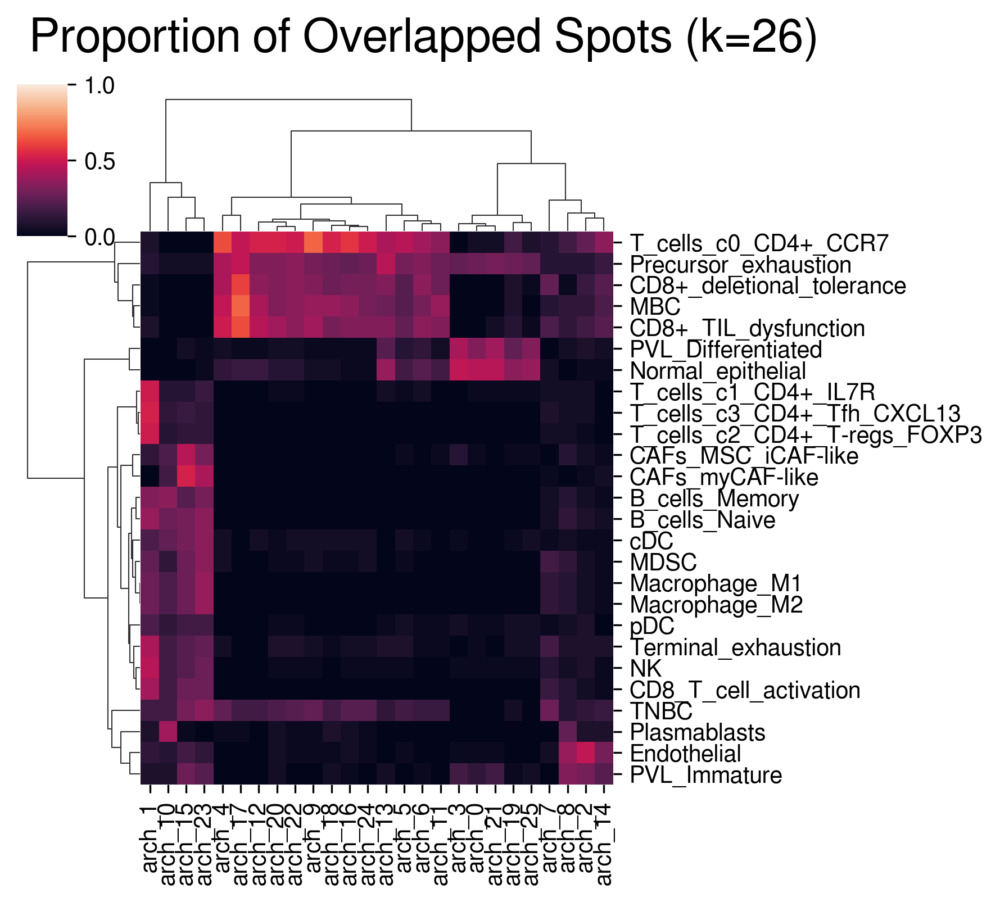

In [154]:
aa_model.plot_mapping(map_raw_df)

- Visualize overlapping features between subset of anchors & archetypes: <br>
  E.g. `T-reg (FOXP3)` & Hierarchical archetypes under `arch_1`

(<Figure size 2700x900 with 2 Axes>, (<AxesSubplot:>, <AxesSubplot:>))

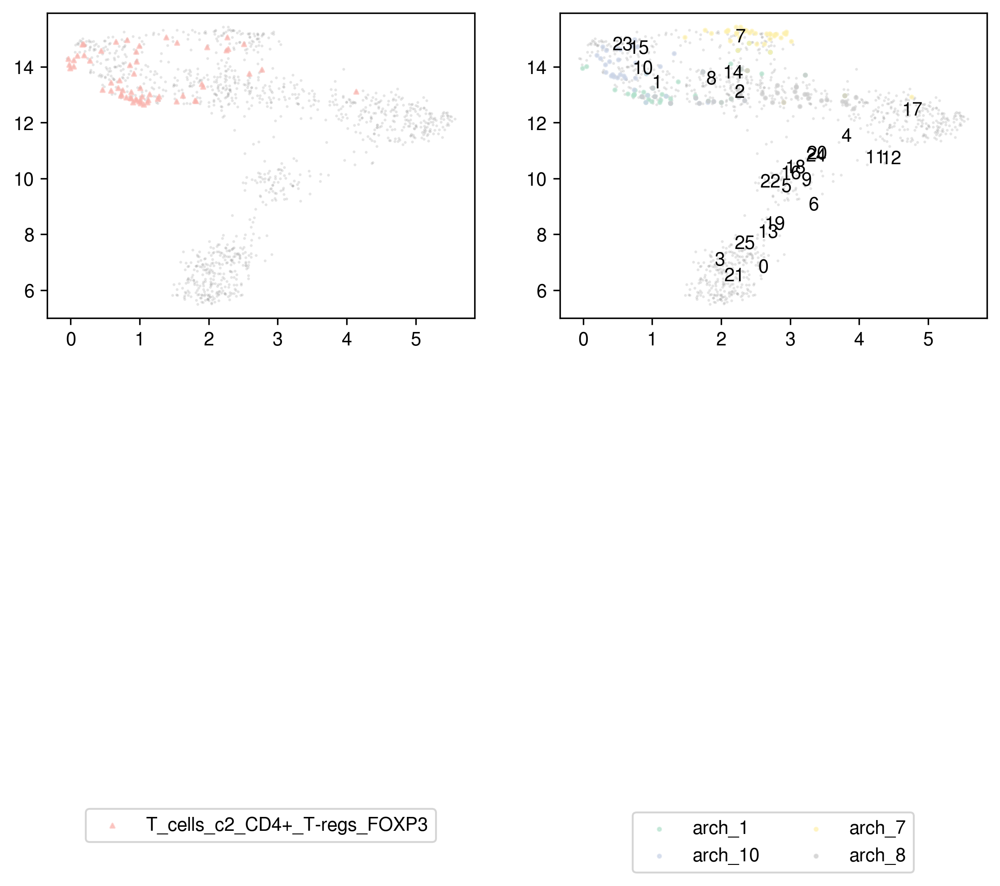

In [157]:
aa_model.plot_anchor_archetype_clusters(
    anchor_df=anchors_df,
    cell_types=['T_cells_c2_CD4+_T-regs_FOXP3'],
    arche_lbls=[
        'arch_' + str(idx)
        for idx in aa_model.arche_dict[1]
    ]
)

##### Application: appending marker genes 
Find a factor with few annotated marker genes, find the archetype(s) having high overlapping ratio with it & append archetypal marker genes to the annotated marker genes.

In [167]:
gene_sig.apply(
    lambda cell_type: 
    (~pd.isna(cell_type)).sum()
)

T_cells_c0_CD4+_CCR7            37
T_cells_c1_CD4+_IL7R            37
T_cells_c3_CD4+_Tfh_CXCL13      34
T_cells_c2_CD4+_T-regs_FOXP3    37
B_cells_Memory                  34
B_cells_Naive                   46
NK                              33
Macrophage_M1                   65
Macrophage_M2                   61
Endothelial                     58
MDSC                             8
MBC                             17
TNBC                            61
CD8_T_cell_activation           25
CD8+_deletional_tolerance       31
CD8+_TIL_dysfunction            71
cDC                             20
pDC                             12
Terminal_exhaustion             31
Precursor_exhaustion            21
CAFs_MSC_iCAF-like              32
CAFs_myCAF-like                 31
PVL_Differentiated              31
PVL_Immature                    31
Normal_epithelial               38
Plasmablasts                    40
dtype: int64

E.g. We have only 8 markers for `MDSC` & 17 for `MBC`, attempt to append marker genes for them:

(i). MDSC

In [172]:
map_dict['MDSC']

'arch_23'

In [173]:
map_df.loc['MDSC', 'arch_23']

0.35

The best aligned archetype to `MDSC` is archetype 23, which has 35$\%$ overlapping between the anchor spot & archetypal spots. <br>
Since the mapping ratio isn't very high, we cautiously select the first `15` marker genes of `arch_23` to `gene_sig['MDSC']`:

In [290]:
gene_sig = utils.append_sigs(
    gene_sig=gene_sig, 
    factor='MDSC', 
    sigs=markers_df['arch_23'],
    n_genes=15
)

(ii). MBC

In [283]:
map_dict['MBC']

'arch_4'

In [284]:
map_df.loc['MBC', 'arch_4']

0.475

The best aligned archetype to `MDSC` is archetype 23, which has 35$\%$ overlapping between the anchor spot & archetypal spots. <br>
Similarly, we select the first `15` marker genes of `arch_4` to `gene_sig['MBC']`:

In [292]:
gene_sig = utils.append_sigs(
    gene_sig=gene_sig,
    factor='MBC',
    sigs=markers_df['arch_4'],
    n_genes=15
)

### Run starfysh

We restart the model for `n_repeat` times, select the best model with lowest loss for parameter `c` (inferred cell-type proportions):

#### (1). Model parameters

In [293]:
n_repeats = 3
epochs = 100
patience = 10
device = torch.device('cpu')

#### (2). Model training

In [294]:
model, loss = utils.run_starfysh(visium_args,
                                 n_repeats=n_repeats,
                                 epochs=epochs,
                                 patience=patience,
                                 device=device
                                )

[2022-08-05 00:24:17] Running Starfysh with 3 restarts, choose the model with best parameters...
[2022-08-05 00:24:17]  ===  Restart Starfysh 1 === 

[2022-08-05 00:24:17] Initializing model parameters...
[2022-08-05 00:24:24] Epoch[10/100], train_loss: 2496.8514, train_reconst: 1426.9230, train_z: 18.8310,train_c: 1017.7550,train_n: 33.3424
[2022-08-05 00:24:32] Epoch[20/100], train_loss: 2272.6110, train_reconst: 1387.1400, train_z: 18.7255,train_c: 835.9427,train_n: 30.8029
[2022-08-05 00:24:39] Epoch[30/100], train_loss: 2132.6229, train_reconst: 1350.5087, train_z: 18.9327,train_c: 733.3299,train_n: 29.8516
[2022-08-05 00:24:46] Epoch[40/100], train_loss: 2066.8456, train_reconst: 1334.6043, train_z: 19.4280,train_c: 683.1603,train_n: 29.6531
[2022-08-05 00:24:52] Epoch[50/100], train_loss: 2039.2630, train_reconst: 1312.1053, train_z: 20.1443,train_c: 677.7823,train_n: 29.2311
[2022-08-05 00:24:59] Epoch[60/100], train_loss: 2010.6349, train_reconst: 1298.3851, train_z: 20.9363,t

### Basic downstream analysis

In [337]:
import json
from scipy import stats

In [295]:
lib_low=torch.exp(torch.Tensor([5.0])).to(device)

inference_outputs, generative_outputs, px = starfysh.model_eval(model,
                                                                adata_sample, 
                                                                visium_args.sig_mean,
                                                                device,
                                                                visium_args.log_lib,
                                                                lib_low
                                                               )
u = post_analysis.get_z_umap(inference_outputs)
u = pd.DataFrame(u,columns=['umap1','umap2'])
u.index = map_info.index

In [296]:
px_0 = starfysh.model_ct_exp(model,
                             adata_sample, 
                             visium_args.sig_mean, 
                             device,
                             visium_args.log_lib,
                             lib_low,
                             ct_idx=0)

#### (1). gene sig mean vs. inferred prop

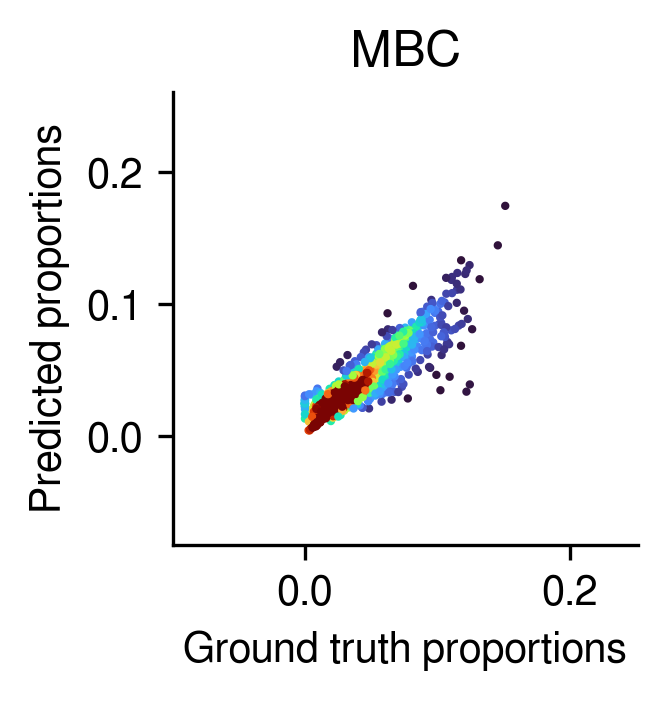

In [298]:
sig_mean_n_df = pd.DataFrame(
    np.array(visium_args.sig_mean)/(np.sum(np.array(visium_args.sig_mean),axis=1,keepdims=True)+1e-5),
    columns=visium_args.sig_mean.columns,
    index=visium_args.sig_mean.index
)

post_analysis.pred_prop_scatter(inference_outputs,
                                sig_mean_n_df,
                                idx=11
                               )

In [27]:
if data_folder =='simu_data':
    post_analysis.plot_type_all(inference_outputs,np.array(u),proportions)

In [28]:
if data_folder =='simu_data':
    post_analysis.get_corr_map(inference_outputs,sig_mean,proportions)

#### (2). inferred density

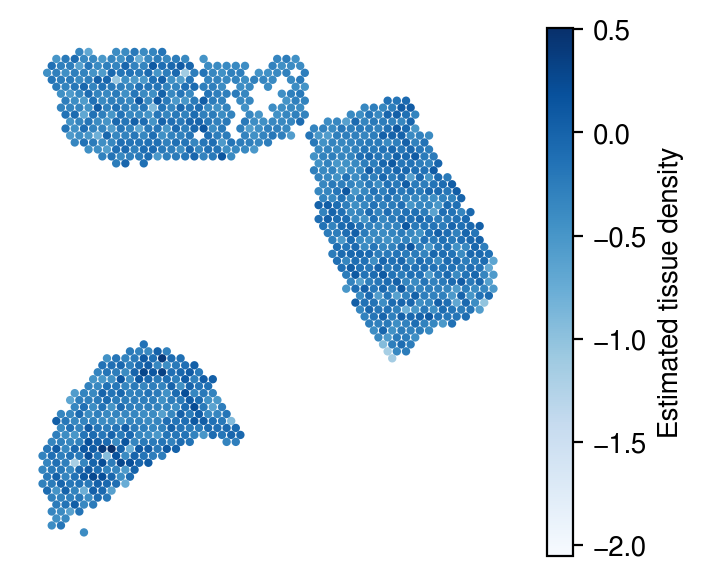

In [299]:
plot_utils.pl_spatial_inf_feature(adata_sample,
                   map_info,
                   inference_outputs,
                   feature='ql_m',
                   idx=0,
                   plt_title='',
                   label='Estimated tissue density',
                   s=4,
                   #vmax=3
                   )

#### (3). inferred prop. on umap (adjust idx number for different cell types)

Cell-type: `MBC`

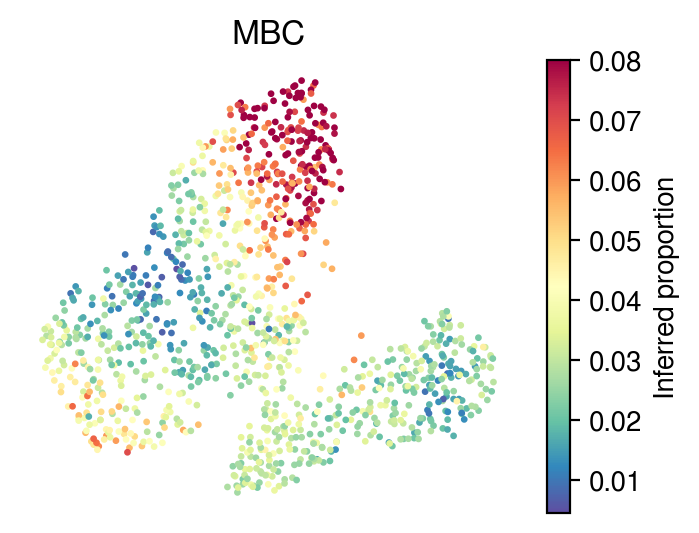

In [300]:
idx=11

plot_utils.pl_umap_feature(adata_sample,
                   u,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),#/np.sum(np.array(sig_mean),axis=1,keepdims=True),
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred proportion',
                   s=2,
                   vmax=0.08
                   )

#### (4). inferred prop. on spatial loc (adjust idx number for different cell types)

*MBC*: `sig_mean` & predicted proportions

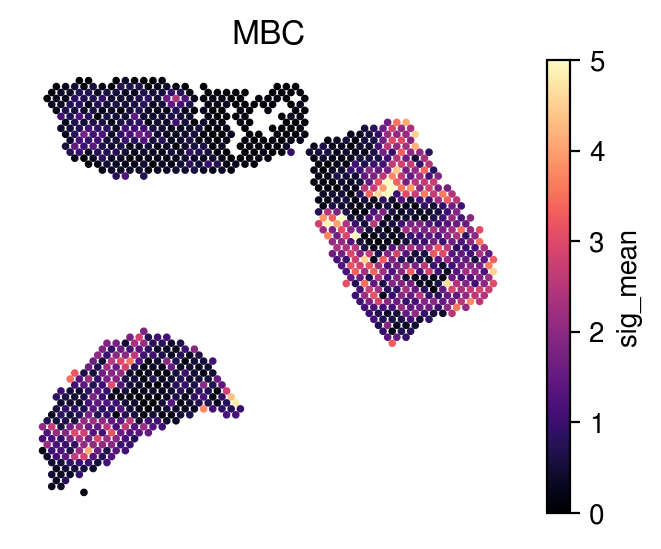

In [328]:
# sig mean
idx=11
plot_utils.pl_spatial_feature(adata_sample,
                              map_info,
                              feature=np.array(visium_args.sig_mean),
                              idx=idx,
                              plt_title=gene_sig.columns[idx],
                              label='sig_mean',
                              s=3,
                              vmax=5
                             )


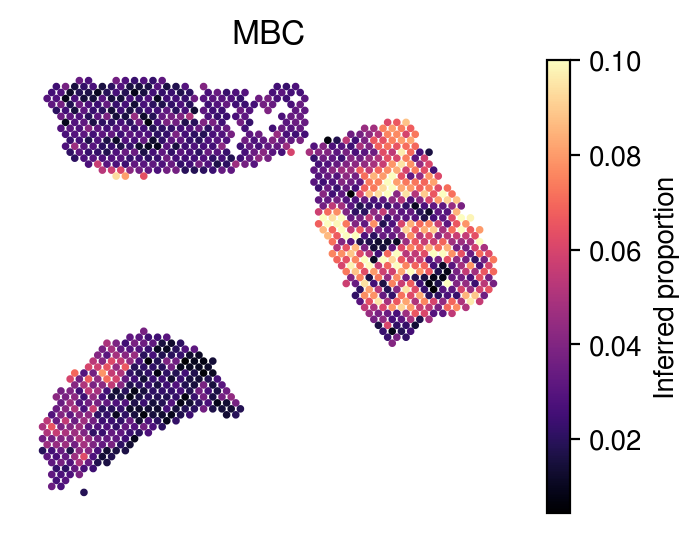

In [327]:
# predicted proportions
idx=11
plot_utils.pl_spatial_feature(adata_sample,
                              map_info,
                              feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),
                              idx=idx,
                              plt_title=gene_sig.columns[idx],
                              label='Inferred proportion',
                              s=3,
                              vmax=0.1
                             )

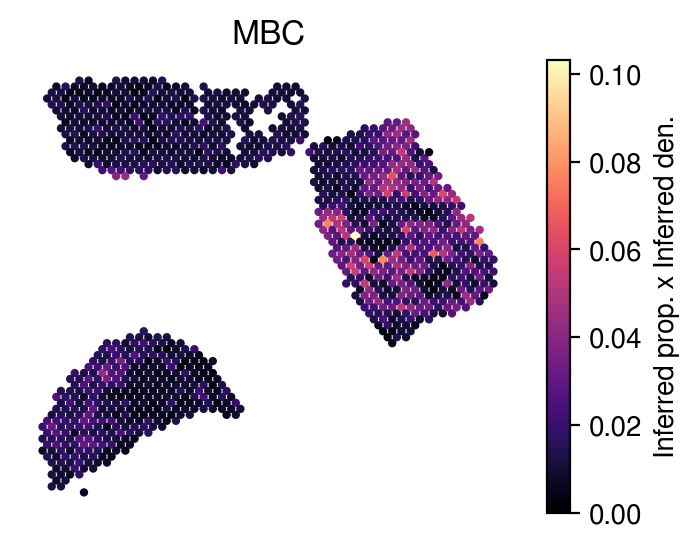

In [334]:
# Proportions * Inferred Density
idx=11
ql_m_norm = np.exp(inference_outputs['ql_m'].detach().cpu().numpy())
ql_m_norm = (ql_m_norm-ql_m_norm.min())/(ql_m_norm.max()-ql_m_norm.min())
                   
plot_utils.pl_spatial_feature(adata_sample,
                   map_info,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy())*ql_m_norm,
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred prop. x Inferred den.',
                   s=4,
                   #vmax=0.005
                   )

*TNBC*: `sig_mean` & predicted proportions

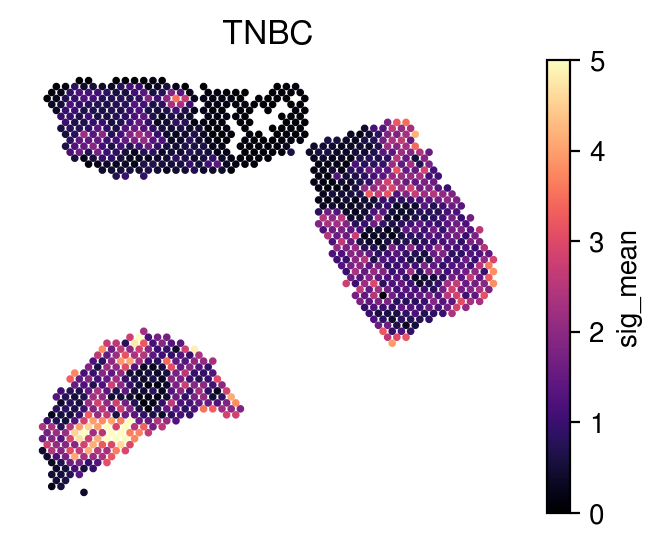

In [330]:
# sig mean
idx=12
plot_utils.pl_spatial_feature(adata_sample,
                              map_info,
                              feature=np.array(visium_args.sig_mean),
                              idx=idx,
                              plt_title=gene_sig.columns[idx],
                              label='sig_mean',
                              s=3,
                              vmax=5
                             )


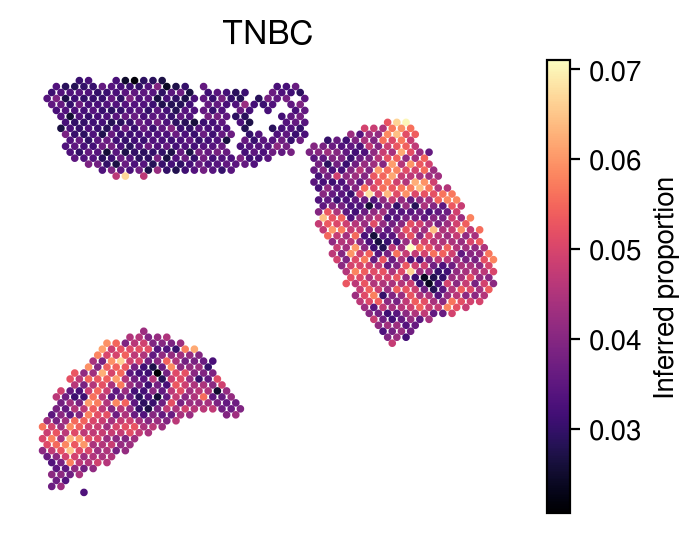

In [333]:
# predicted proportions
idx=12
plot_utils.pl_spatial_feature(adata_sample,
                              map_info,
                              feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),
                              idx=idx,
                              plt_title=gene_sig.columns[idx],
                              label='Inferred proportion',
                              s=3
                             )

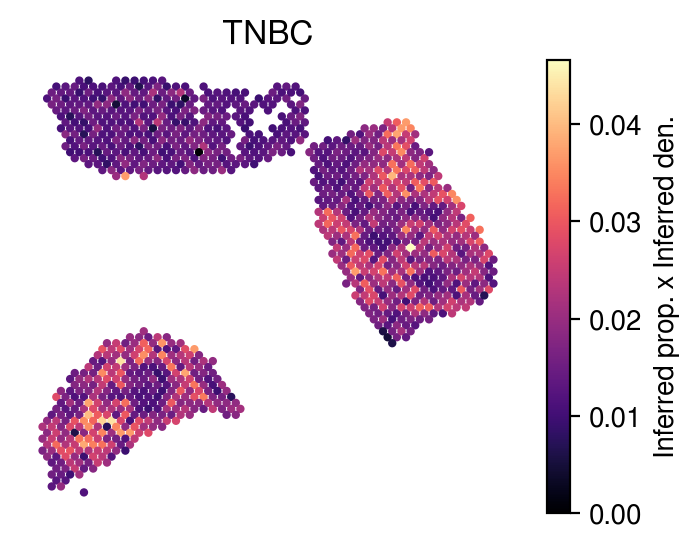

In [335]:
# Proportions * Inferred Density
idx=12
ql_m_norm = np.exp(inference_outputs['ql_m'].detach().cpu().numpy())
ql_m_norm = (ql_m_norm-ql_m_norm.min())/(ql_m_norm.max()-ql_m_norm.min())
                   
plot_utils.pl_spatial_feature(adata_sample,
                   map_info,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy())*ql_m_norm,
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred prop. x Inferred den.',
                   s=4,
                   #vmax=0.005
                   )

#### (5). Inferred cell-type specific expressions for each spots

In [307]:
pred_exp = {}
for i, label in enumerate(gene_sig.columns):
    pred_exp[label] = starfysh.model_ct_exp(model,adata_sample, 
                                                          visium_args.sig_mean, 
                                                          device,
                                                          visium_args.log_lib,
                                                          lib_low,
                                                          ct_idx=i
                                                         ).tolist()

Plot spot-level expression of `PDCD1` from *CD8 T cell activation*:

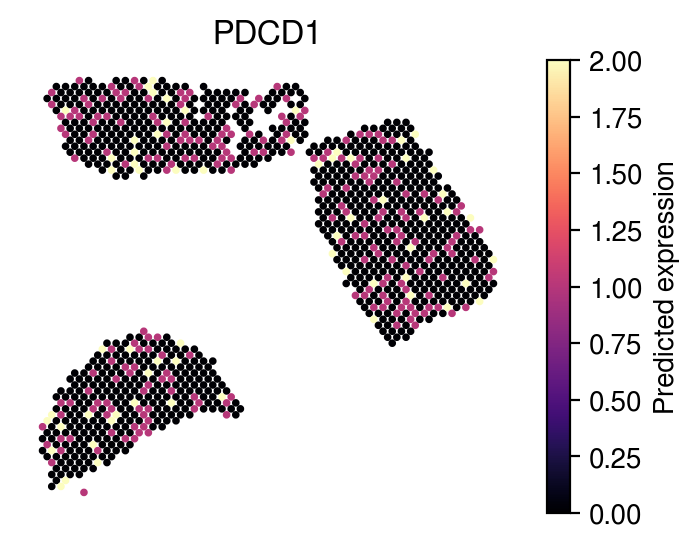

In [322]:
from scipy import stats

"""
px_0 = starfysh.model_ct_exp(model,adata_sample, 
                             sig_mean, device,log_lib,lib_low,
                             ct_idx=13
                            )
idx=list(adata_sample.var_names).index('PDCD1')
"""

plot_utils.pl_spatial_feature(adata_sample,
                   map_info,
                   feature=np.asarray(pred_exp['CD8_T_cell_activation']),
                   idx=list(adata_sample.var_names).index('PDCD1'),
                   plt_title=adata_sample.var_names[idx],
                   label='Predicted expression',
                   s=3,
                   vmax=2
                   )

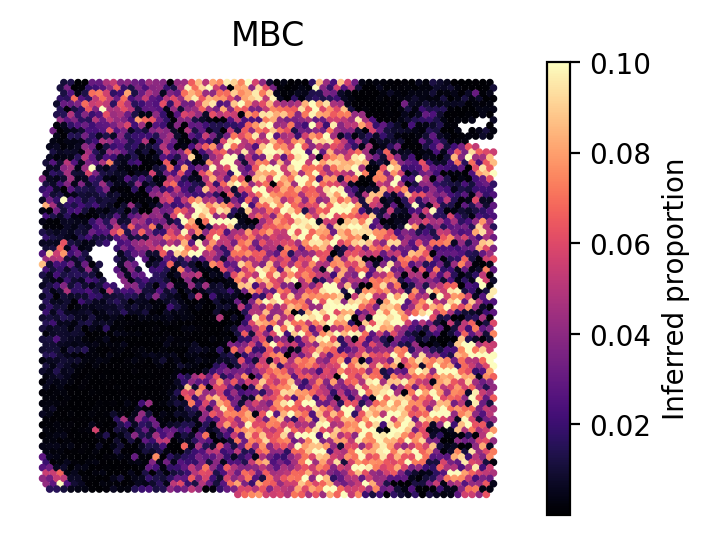

In [45]:
idx=11

plot_utils.pl_spatial_feature(adata_sample,
                   map_info,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred proportion',
                   s=3,
                   vmax=0.1
                             )

In [39]:
dist = {
        'px_rate': generative_outputs['px_rate'].detach().cpu().numpy().tolist(),
        'px_r': generative_outputs['px_r'].detach().cpu().numpy().tolist(),
        'pc_p': generative_outputs['pc_p'].detach().cpu().numpy().tolist(),

        'qc_m': inference_outputs['qc_m'].detach().cpu().numpy().tolist(),
        'qc': inference_outputs['qc'].detach().cpu().numpy().tolist(),
        'qz_m': inference_outputs['qz_m'].detach().cpu().numpy().tolist(),
        'qz_m_ct': inference_outputs['qz_m_ct'].detach().cpu().numpy().tolist(),
        'qz_logv': inference_outputs['qz_logv'].detach().cpu().numpy().tolist(),
        'qz_logv_ct': inference_outputs['qz_logv_ct'].detach().cpu().numpy().tolist(),
        'qz': inference_outputs['qz'].detach().cpu().numpy().tolist(),
        'ql_m': inference_outputs['ql_m'].detach().cpu().numpy().tolist(),
        'ql_logv': inference_outputs['ql_logv'].detach().cpu().numpy().tolist(),
        'ql': inference_outputs['ql'].detach().cpu().numpy().tolist(),
}


import json
#with open('/content/drive/MyDrive/SpatialModelProject/model_test_colab/results/02_factor/'+sample_id+'_factor.json', 'w') as fp:
with open('results/02_factor/'+sample_id+'_factor.json', 'w') as fp:

    json.dump(dist, fp)

In [41]:
with open('results/02_factor/'+sample_id+'_pred_exp.json', 'w') as fp:
    json.dump(pred_exp, fp)

---